In [27]:
# import the necessary packages
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [28]:
def to_RGB(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

54.68% white background


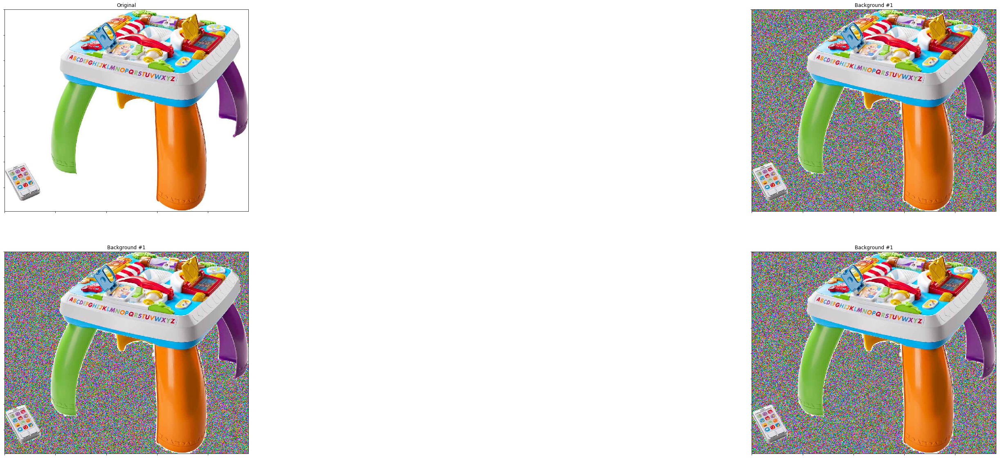

25.27% white background


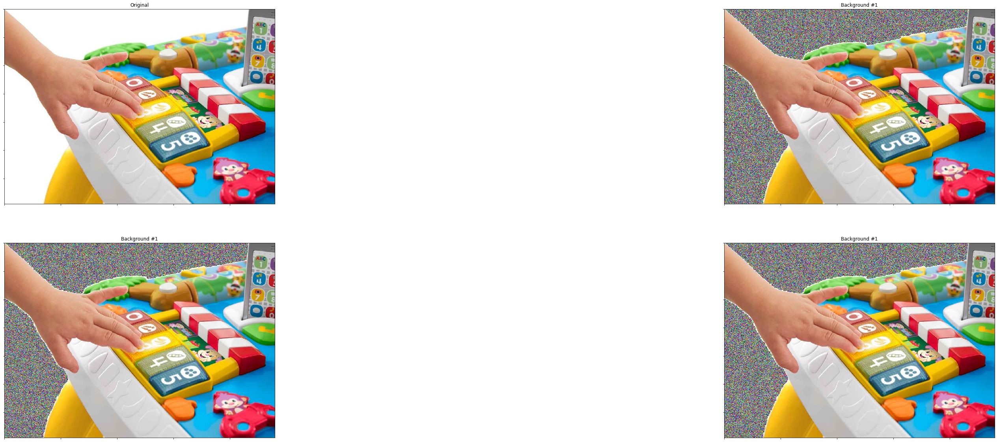

0.00% white background
63.67% white background


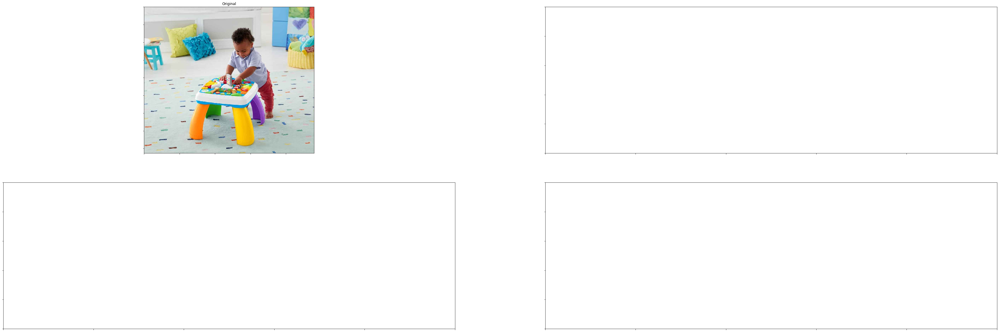

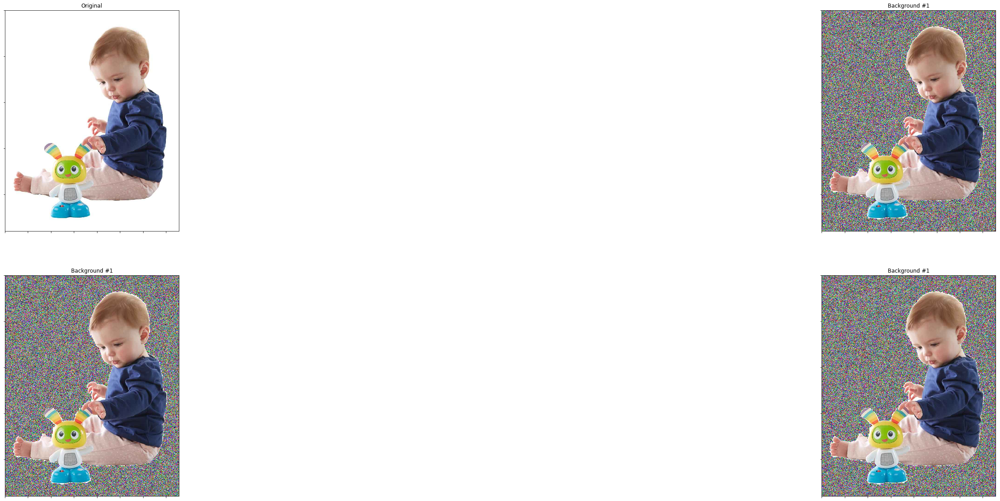

6.56% white background


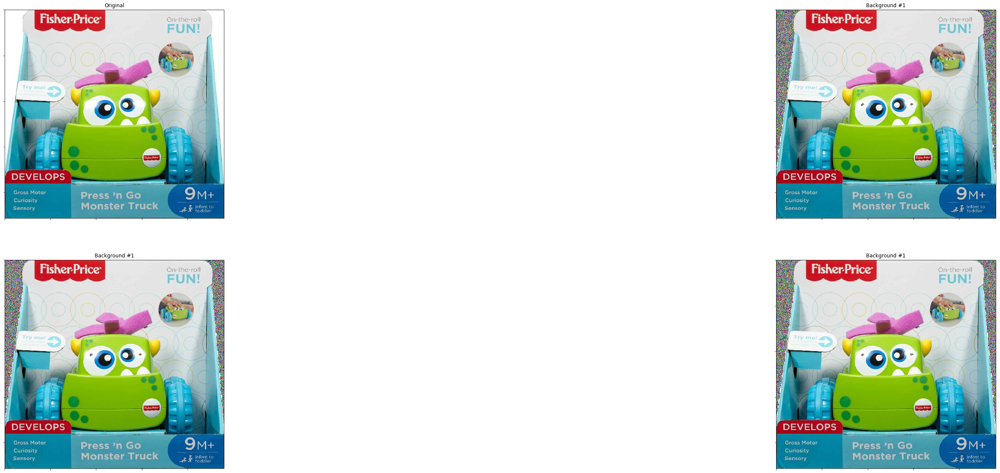

51.10% white background


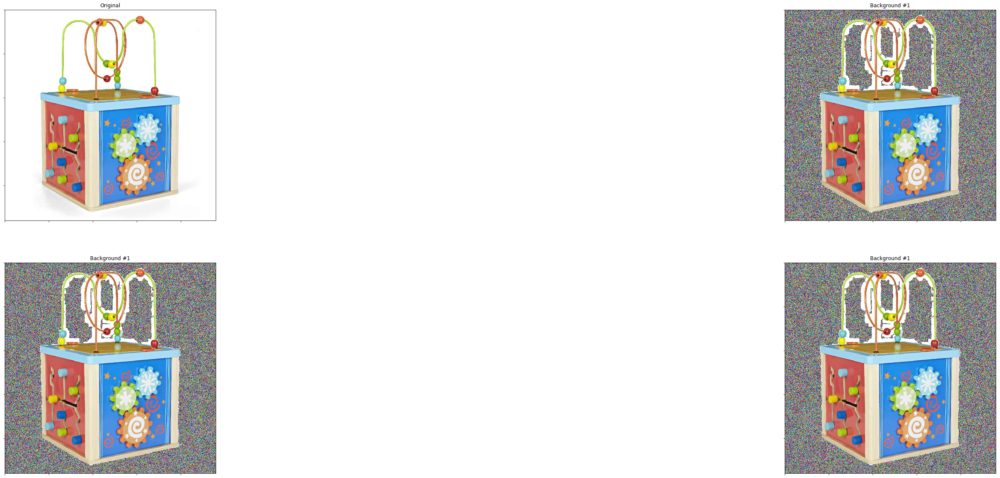

In [29]:
for pic in range(0,6):
    f, ax = plt.subplots(2, 2, squeeze=False, figsize=(60,20))
    plt.setp([a.get_xticklabels() for a in f.axes[:]], visible=False)
    plt.setp([a.get_yticklabels() for a in f.axes[:]], visible=False)
    plot = 0

    orig = cv2.imread("{}.jpg".format(pic+1), cv2.IMREAD_COLOR)

    shifted = cv2.pyrMeanShiftFiltering(orig, sp=6, sr=9)
    border = cv2.copyMakeBorder(shifted, 1, 1, 1, 1, borderType=cv2.BORDER_CONSTANT, value=[255,255,255])
    mask = np.zeros((border.shape[0]+2, border.shape[1]+2), np.uint8)
    flags = 8 | cv2.FLOODFILL_MASK_ONLY
    tolerance = (1,)*3
    cv2.floodFill(image=border, mask=mask, seedPoint=(0,0), newVal=255, loDiff=tolerance, upDiff=tolerance, flags=flags)
    mask = mask[2:-2,2:-2]

    ax[plot//2,plot%2].imshow(to_RGB(orig)), ax[plot//2,plot%2].set_title("Original")
    plot += 1 
    
    wt_bk = np.float(np.count_nonzero(mask))/mask.size*100.
    print ("{0:.2f}% white background".format(wt_bk))
    if wt_bk < 5.0:
        plot += 3
        continue

#    shifted2 = cv2.pyrMeanShiftFiltering(orig, sp=6, sr=50)
#    shifted3 = cv2.bilateralFilter(orig, d=7, sigmaColor=200, sigmaSpace=20)
#    shifted4 = cv2.medianBlur(orig, ksize=33)

    for i in range(0,3):
        
#        bk_num = np.random.randint(1,11)
#        bk = cv2.resize(cv2.imread("bk_{}.jpg".format(bk_num), cv2.IMREAD_COLOR), (orig.shape[1], orig.shape[0]))
        bk = np.random.randint(low=0, high=256, size=(orig.shape[0],orig.shape[1],3))

#        new = np.zeros_like(orig)
#        new[mask==0] = orig[mask==0]
#        new[mask==1] = bk[mask==1]

#        new2 = np.zeros_like(orig)
#        new2[mask==0] = orig[mask==0]
#        new2[np.logical_and((shifted2==255).all(axis=-1), mask==0)] = bk[np.logical_and((shifted2==255).all(axis=-1), mask==0)]
#        new2[mask==1] = bk[mask==1]

#        new3 = np.zeros_like(orig)
#        new3[mask==0] = orig[mask==0]
#        new3[np.logical_and((shifted3==255).all(axis=-1), mask==0)] = bk[np.logical_and((shifted3==255).all(axis=-1), mask==0)]
#        new3[mask==1] = bk[mask==1]

        new4 = np.zeros_like(orig)
        new4[mask==0] = orig[mask==0]
        new4[np.logical_and((shifted==255).all(axis=-1), mask==0)] = bk[np.logical_and((shifted==255).all(axis=-1), mask==0)]
        new4[mask==1] = bk[mask==1]

        ax[plot//2,plot%2].imshow(to_RGB(new4)), ax[plot//2,plot%2].set_title("Background #{}".format(bk_num))
        plot+=1
#        ax[0,0].imshow(to_RGB(new)), ax[0,1].set_title("Background #{}".format(i))
#        ax[0,1].imshow(to_RGB(new2)), ax[0,1].set_title("pyrMeanShiftFiltering #{}".format(i))
#        ax[1,0].imshow(to_RGB(new3)), ax[1,0].set_title("Bilateral #{}".format(i))
#        ax[1,1].imshow(to_RGB(new4)), ax[1,1].set_title("Median #{}".format(i))

    plt.show()